# Tutorial 
## From Stacked TIF Images to Angular and Pair Correlation Metrics

Welcome to this tutorial notebook! In this notebook, we will be exploring the `colonyimages` package, a tool designed to analyze and process images of biological colonies. 

The `colonyimages` package provides a set of functions to process and analyze stacked TIF images of colonies. It allows us to extract valuable information about the growth and behavior of colonies over time. 

The package includes functions for image preprocessing, colony expansion, and metric calculation. It provides the ability to calculate the angular and pair correlation metrics, which are crucial for understanding the spatial distribution and growth patterns of colonies. 

If you want to gain an understanding of the metrics and the ideas/interpretation of the chosen methods, we highly encourage you to read our paper first, as this notebook is just a recipe on how to use it, not why to use it. 

In this tutorial, we will walk through the process of using the `colonyimages` package to go from a stacked TIF image to calculated angular and pair correlation metrics. We will cover the steps of image preprocessing, simulating colony expansion, metric calculation, providing a comprehensive overview of the capabilities of the `colonyimages` package.

Whether you are a biologist looking to analyze your colony images, a data scientist interested in image processing, or a student learning about image analysis, this tutorial will provide you with the knowledge and tools to effectively use the `colonyimages` package.

### 1. Import packages 
As the colonyimages package is a local package, this notebook needs to be executed within the package's folder. To activate and check if colonyimages is working, execute the following lines.

In [3]:
using Pkg
Pkg.activate(@__DIR__)
#Pkg.status()
Pkg.instantiate()
using Revise, CairoMakie
using ColonyImages
using DataFrames, CSV, FileIO

  Activating project at `c:\Users\Andreas\Dropbox\phd\Image_analysis\ColonyImages`


There should be an output listing all the installed packages starting with `"Project ColonyImages v1..."`

If you execute this line the first time, this will take a few minutes as all packages that are not already on your system, need to be installed. 

In order to speed up computation, the creation and analysis of the colonies is multithreaded. To further enhance performance, execute this notebook with a Julia kernel that utilizes more than one thread, ideally matching the number of physical cores on your CPU. Learn how to set up a Julia kernel with more threads [here](https://discourse.julialang.org/t/enable-multiple-cores-for-jupyter-lab/18658/5).

In [4]:
Threads.nthreads()

10

### 2. Create Dataframe

The package is designed to store all its analysis data in DataFrames with a predefined structure. Therefore, the first step is always to create an empty DataFrame of the correct size using the `Dataframe_Colony()` function.

In [5]:
df = DataFrame_Colony()

Row,data_set,colony,time,metric_OG,metric_cov,pair_OG,pair_cov,OG_size,border_points,Parameters
,String,String,Int64,Array…,Array…,Array…,Array…,Int64,Array…,paramete…


To understand what each column name means/ which data will be stored later, we can used the `@h` macro defined by `ColonyImages.jl` to get a nicely formatted markdown output of the docstring of the function (there is documentation/docstring for every function in `ColonyImages.jl`.) 


In [6]:
@h DataFrame_Colony

```
DataFrame_Colony()
```

This function creates and returns an empty DataFrame with a predefined structure for storing analysis data in the `ColonyImages` package.

# Returns

  * `df`: A DataFrame with the following columns:

      * `data_set::String[]`: A column for the dataset names.
      * `colony::String[]`: A column for the colony names.
      * `time::Int[]`: A column for the time points.
      * `metric_OG::Vector{Vector{Int64}}`: A column for the angular metric data calculated using the stacking approach. Each entry is a vector of integers.
      * `metric_cov::Vector{Vector{Int64}}`: A column for the angular metric data calculated using the convolution approach. Each entry is a vector of integers.
      * `pair_OG::Vector{Vector{Int64}}`: A column for the pair correlation calculated using the stacking approach. Each entry is a vector of integers.
      * `pair_cov::Vector{Vector{Int64}}`: A column for the pair correlation calculated using the convolution approach. Each entry is a vector of integers.
      * `OG_size::Int[]`: A column for the sizes of the colonies in pixels at t = 0, used for later normalizations.
      * `border_points::Vector{Vector{CartesianIndex{2}}}`: A column for the border points of the colonies. Each entry is a vector of CartesianIndex{2}.
      * `Parameters::Vector{parameters}`: A column for the parameters used in the simulation or analysis. Each entry is a `parameters` object.

# Example

```julia
df = DataFrame_Colony()
```


### 3. Load Data 
The package, by default, stores its data in the data folder inside the packge folder structure. However, this can be changed to any folder. In this small test case, we will be using a specific dataset that you have been created before by working through the Fiji tutorial. If haven't changed any of the default values, the data should be stored in the Fiji/output folder in results.

In [7]:
path = "Fiji\\output\\results"
readdir(path)

9-element Vector{String}:
 "Colony-1 seg.tif"
 "Colony-2 seg.tif"
 "Colony-3 seg.tif"
 "Colony-4 seg.tif"
 "Colony-5 seg.tif"
 "Colony-6 seg.tif"
 "Colony-7 seg.tif"
 "Colony-8 seg.tif"
 "timepoints.csv"

#### 3.1 Structure of the Data
Each `.tif` file contains the stacked  binary timeseries images of one colony. 
The time series colony images have been taken at certain dates/times T(n) (where n is the number of time points). The specific dates can be found in the metadata of the raw tif images. Here, only the relative time points are relevant, therefore the first images are set to T_r(1) = 0 and the following to the next full hours of T(n)_r = T(n)-T(1). The time points are stored in a csv file called `timepoints.csv` located next to the image data. If timepoints.csv does not exist already, it will be created manually by the cell below.

In [8]:
if "timepoints.csv" ∉ readdir(path)
    
    df2 = DataFrame(time = Float64[0,24,54])
    
    if length(df2.time) != size(load(joinpath.(path, filter(x->x[end-2:end]=="tif",readdir(path)))[1]))[3]
        println("ERROR ERROR ERROR ")
    else
        CSV.write(joinpath(path,"timepoints.csv"), df2)   
    end
else println("timespoints already set")
end

time_points = CSV.read(joinpath(path,"timepoints.csv"), DataFrame).time

timespoints already set


3-element Vector{Float64}:
  0.0
 24.0
 54.0

All `tif` files inside chosen folder are loaded into img_vec with is a vector of stacked images(3 dimensional (x,y,t) arrays). The images are cast to bit arrays in the correct order and format with the `b_w()` function. 

In [9]:
colonies = filter(x->x[end-2:end]=="tif",readdir(path))
img_vec  = load.(joinpath.(path, colonies));
img_int_vec = b_w.(img_vec);

Loading: 100%|███████████████████████████████████████████| Time: 0:00:01


### 4. Parameters for Images analysis and simulations 


For convenience purposes, all parameters are bundled together in the parameters struct, which comes with default values. All relevant parameters for importing a dataset are set below. The function lattice_points() creates ascending points on a lattice with half of the size of the images, sorted by their distance to the origin [0,0]. These are saved and needed to speed up some computations later on. 

In case you are interested in the default values and other parameters of the parameter struct, use `@h` or `@doc` in a notebook or `?` in the REPL to read the docstring.

In [11]:
para = parameters(
        im_size = [size(img_int_vec[1])[1:2]...],
        time_points = time_points,
        colony_nr = length(img_int_vec),
        colonies = colonies,
        kernel_ratio = 0.1,);

Points= lattice_points(Int(maximum(para.im_size)÷2));

### 5. Test plotting and calculation of Metrics
The function `plot_time_series_metrics(img_vec, para, Points)` plots a heatmap of all loaded colonies together with their calculated angular and pair correlation metric. This can be used to explore the data and see if everything worked as intended.

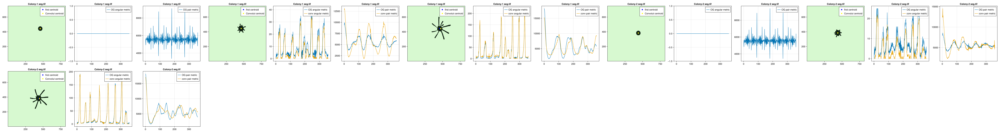

In [13]:
plot_time_series_metrics(img_int_vec[1:2], para, Points)

For the calculation and storage of metrics, along with some other important parameters, we use the `save_time_series_metrics!` function. This function stores the data in the provided DataFrame. We can also assign a name to our dataset, which will be stored in the DataFrame as well, ensuring correct assignment later on. Please note that this function is multithreaded and shows almost linear scaling with the number of CPU cores. However, you need to start Julia with more threads to take advantage of this feature.

In [14]:
save_time_series_metrics!(img_int_vec, para,df,  Points, name_data = "tutorial_data")

"tutorial_data 2024_08_14"

In [15]:
first(df,1)

Row,data_set,colony,time,metric_OG,metric_cov,pair_OG,pair_cov,OG_size,border_points,Parameters
,String,String,Int64,Array…,Array…,Array…,Array…,Int64,Array…,paramete…
1,tutorial_data 2024_08_14,Colony-1 seg.tif,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0 … 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[15, 0, 8, 6, 9, 7, 9, 7, 9, 10 … 7, 10, 9, 7, 9, 7, 9, 6, 8, 15]","[5863, 4800, 5226, 5626, 5649, 5484, 5735, 5606, 5927, 5327 … 5422, 5865, 5357, 5662, 5483, 5815, 5729, 5289, 4778, 6276]","[5780, 4819, 5315, 5687, 5631, 5343, 5647, 5637, 5899, 5331 … 5252, 5759, 5583, 5609, 5460, 5611, 5730, 5371, 4804, 6167]",2993,"CartesianIndex{2}[CartesianIndex(453, 413), CartesianIndex(454, 413), CartesianIndex(455, 413), CartesianIndex(456, 413), CartesianIndex(457, 413), CartesianIndex(458, 413), CartesianIndex(459, 413), CartesianIndex(460, 413), CartesianIndex(461, 413), CartesianIndex(462, 413) … CartesianIndex(460, 473), CartesianIndex(461, 473), CartesianIndex(462, 473), CartesianIndex(463, 473), CartesianIndex(464, 473), CartesianIndex(465, 473), CartesianIndex(466, 473), CartesianIndex(456, 474), CartesianIndex(457, 474), CartesianIndex(458, 474)]","parameters([0.0, 24.0, 54.0], 0.7, 0.8, 0.1, 360, 2000000, 300, [818, 750], 3, 41, [409, 375], [0.029717, 0.0, 0.0, 0.0], #5, 0.01, [0 1 0; 1 -4 1; 0 1 0], 8, [""Colony-1 seg.tif"", ""Colony-2 seg.tif"", ""Colony-3 seg.tif"", ""Colony-4 seg.tif"", ""Colony-5 seg.tif"", ""Colony-6 seg.tif"", ""Colony-7 seg.tif"", ""Colony-8 seg.tif""], 2.0, [0.0, 1.01943, 3.86145], [1.01943, 2.84202], 15, 0.1, #7, 0.2, 0.9993, 0.9993)"


### 6. Make a Simulation 

Now that we have imported an existing dataset, let's explore another capability of `colonyimages.jl`: simulating the expansion of colonies using a modified Eden model. 

For this, we need to create another instance of the parameters struct, which encodes all relevant parameters for the simulations (as well as all other parameters of `colonyimages.jl`):

- `im_size`: Size of the simulated grid as a vector of two integers. A higher value gives better accuracy but takes longer to compute.
- `time_points`: The start, end, and steps of the timepoints in the simulation where the current state is saved.
- `colony_nr`: Number of simulated colonies. More colonies provide better statistics but take longer to compute.
- `number_finger`: Number of fingers the simulated colonies can grow.
- `spawn_rate`: A continuous property of the `finger_weak` simulation B (see paper for nomenclature) that describes the transition between case A (no fingers, only radial growth) and case C (only finger growth). 0.0 corresponds to case C and 1.0 corresponds to case A.
- `Growth_rate`: Parameters of the growth equation in the appendix as a vector of four floating point numbers (whereas [t, L, p, t_0]).

In [16]:
para_sim = parameters(
        im_size = [800,800],
        time_points = [0:4.0:52...],
        colony_nr = 8, 
        number_finger = 15,
        spawn_rate = 0.1,
        growth_rate = [0.02971700864000873,0.0,.0,.0]
        )

simulations = ["Random", "Finger_weak", "Finger_strong"]
Points = lattice_points(Int(maximum(para_sim.im_size)÷2));


The simulated colonies are stored in the same data structure as the processed fluorescent images, a `Vector` of `BitArrays`, where a zero symbolizes empty space and a one represents occupied space of the colony. 

Three cases (`["Random", "Finger_weak", "Finger_strong"]`) are simulated, and the corresponding 3 `Vectors of BitArrays` are stored in another Vector called `vec_of_sims`. 

The `initialize_colonies` function creates this data structure, based on the given parameters.

In [17]:
vec_of_sims = initialize_colonies(para_sim, simulations)

3-element Vector{Vector{BitArray{3}}}:
 [[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; … ;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; … ;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; … ;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0;;; 0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], [0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0

The `growth_colonies!` function is used to grow artificial colonies in the `vec_of_sims` vector. So far, three growth types are supported: `["Random", "Finger_weak", "Finger_strong"]`, but additional growth types with other rules could be easily added. 

This function is multithreaded, and the growth of each colony is handled by a separate thread. Therefore, it scales almost linearly with the number of threads (of course, only if the number of threads is less than `colony_nr`).

In [19]:
growth_colonies!(vec_of_sims, para_sim, Points, simulations)

Now, we can do the same as for the real colonies, test, plot, and calculate the metrics using the same function as above.

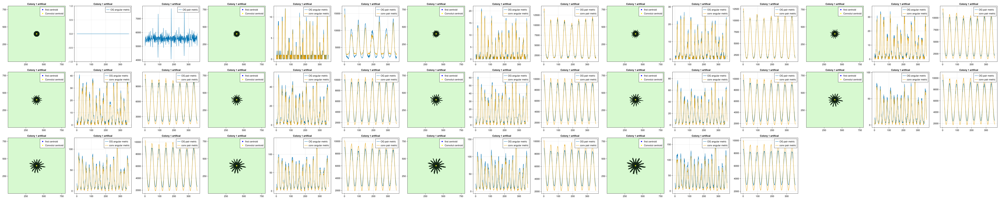

In [20]:
plot_time_series_metrics(vec_of_sims[2][1:1], para_sim, Points)

The obvious difference is that there are many more time points in the simulation than in the real images, as we can choose an arbitrarily small time resolution to analyze the data.

The data is analyzed and saved in the same dataframe as the real colonies, to enable an easy comparison.

> **Note:** The cell below can take up to 15 minutes to complete when using only one thread, as a lot of computations have to be made. We highly encourage the use of multiple threads to speed up the computation.

In [21]:
for (i,name) in collect(enumerate(simulations))
    save_time_series_metrics!(vec_of_sims[i], para_sim,df,Points, name_data = name)
end

In [23]:
first(df,1)

Row,data_set,colony,time,metric_OG,metric_cov,pair_OG,pair_cov,OG_size,border_points,Parameters
,String,String,Int64,Array…,Array…,Array…,Array…,Int64,Array…,paramete…
1,tutorial_data 2024_08_14,Colony-1 seg.tif,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0 … 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[15, 0, 8, 6, 9, 7, 9, 7, 9, 10 … 7, 10, 9, 7, 9, 7, 9, 6, 8, 15]","[5863, 4800, 5226, 5626, 5649, 5484, 5735, 5606, 5927, 5327 … 5422, 5865, 5357, 5662, 5483, 5815, 5729, 5289, 4778, 6276]","[5780, 4819, 5315, 5687, 5631, 5343, 5647, 5637, 5899, 5331 … 5252, 5759, 5583, 5609, 5460, 5611, 5730, 5371, 4804, 6167]",2993,"CartesianIndex{2}[CartesianIndex(453, 413), CartesianIndex(454, 413), CartesianIndex(455, 413), CartesianIndex(456, 413), CartesianIndex(457, 413), CartesianIndex(458, 413), CartesianIndex(459, 413), CartesianIndex(460, 413), CartesianIndex(461, 413), CartesianIndex(462, 413) … CartesianIndex(460, 473), CartesianIndex(461, 473), CartesianIndex(462, 473), CartesianIndex(463, 473), CartesianIndex(464, 473), CartesianIndex(465, 473), CartesianIndex(466, 473), CartesianIndex(456, 474), CartesianIndex(457, 474), CartesianIndex(458, 474)]","parameters([0.0, 24.0, 54.0], 0.7, 0.8, 0.1, 360, 2000000, 300, [818, 750], 3, 41, [409, 375], [0.029717, 0.0, 0.0, 0.0], #5, 0.01, [0 1 0; 1 -4 1; 0 1 0], 8, [""Colony-1 seg.tif"", ""Colony-2 seg.tif"", ""Colony-3 seg.tif"", ""Colony-4 seg.tif"", ""Colony-5 seg.tif"", ""Colony-6 seg.tif"", ""Colony-7 seg.tif"", ""Colony-8 seg.tif""], 2.0, [0.0, 1.01943, 3.86145], [1.01943, 2.84202], 15, 0.1, #7, 0.2, 0.9993, 0.9993)"


In [24]:
unique(df.data_set )    

4-element Vector{String}:
 "tutorial_data 2024_08_14"
 "Random 2024_08_14"
 "Finger_weak 2024_08_14"
 "Finger_strong 2024_08_14"

### 7. Make some analysis
To make all plots created in `CairoMakie` look the same, plotting parameters are set with the `analysis_parameters` struct and the theming functionabiluty of `CairoMakie`.


In [25]:
plot_para = analysis_parameters(plot_theme =
    Theme(  fontsize = 30,
    size = (1000,800),
    ScatterLines = (markersize = 18,linewidth = 4,),
    ))
update_theme!(plot_para.plot_theme)

In the next cells below there will be some analysis is performed using the tutorial data together with the freshly simulated colonies. 
The analysis is done using the packages `chain` and `DataFramesMeta` to manipulate the underlying dataframes with the split apply combine strategy. 

In [26]:
using Chain, DataFramesMeta, Statistics

#### 7.1 Surface increase

In [28]:
surface_data = @chain df begin 

    groupby([:data_set,:colony])
    @combine(:surface = length.(:border_points)/(length(:border_points[1])), :time = :time)
    groupby([:data_set, :time]) 
    @combine(:surface_mean = mean(:surface), :surface_std = std(:surface))

end
first(surface_data, 3)

Row,data_set,time,surface_mean,surface_std
,String,Int64,Float64,Float64
1,tutorial_data 2024_08_14,0,1.0,0.0
2,tutorial_data 2024_08_14,24,2.43392,0.724098
3,tutorial_data 2024_08_14,54,8.63879,2.55943


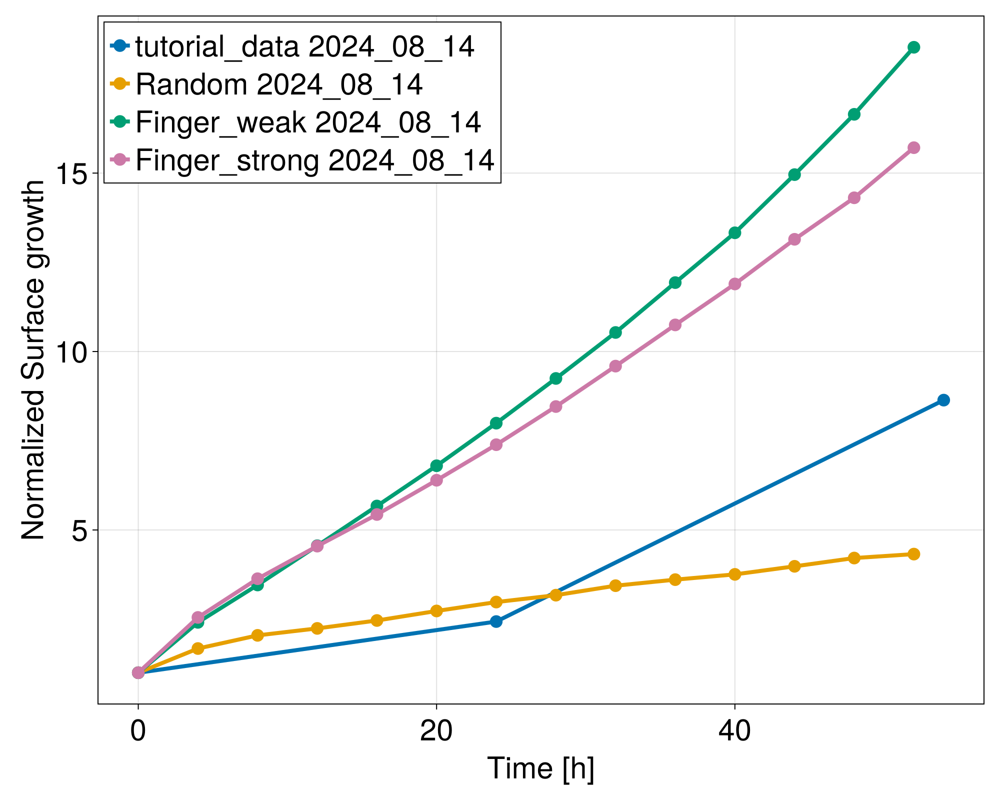

In [29]:
model_name = unique(df.data_set )    
j = 1
fig = Figure()
ax = Axis(fig[1,1], xlabel = "Time [h]", ylabel = "Normalized Surface growth")
for (k, i) in pairs(groupby(surface_data,:data_set))
    scatterlines!(ax, i.time, i.surface_mean, label = "$(model_name[j])")
    j += 1
end
axislegend(ax, position = :lt)
fig

#### 7.2 Coefficient of variation of Angular Metric

In [30]:
cv_angular_metric = @chain df begin 
    groupby([:time,:data_set])
    @combine(:cv_angu = mean(std.(:metric_OG)./(mean.(:metric_OG))))
end
# replace NaN with 0
cv_angular_metric.cv_angu .= ifelse.(isnan.(cv_angular_metric.cv_angu), 0.0, cv_angular_metric.cv_angu)
first(cv_angular_metric, 3)

Row,time,data_set,cv_angu
,Int64,String,Float64
1,0,tutorial_data 2024_08_14,0.0
2,24,tutorial_data 2024_08_14,1.01321
3,54,tutorial_data 2024_08_14,1.50575


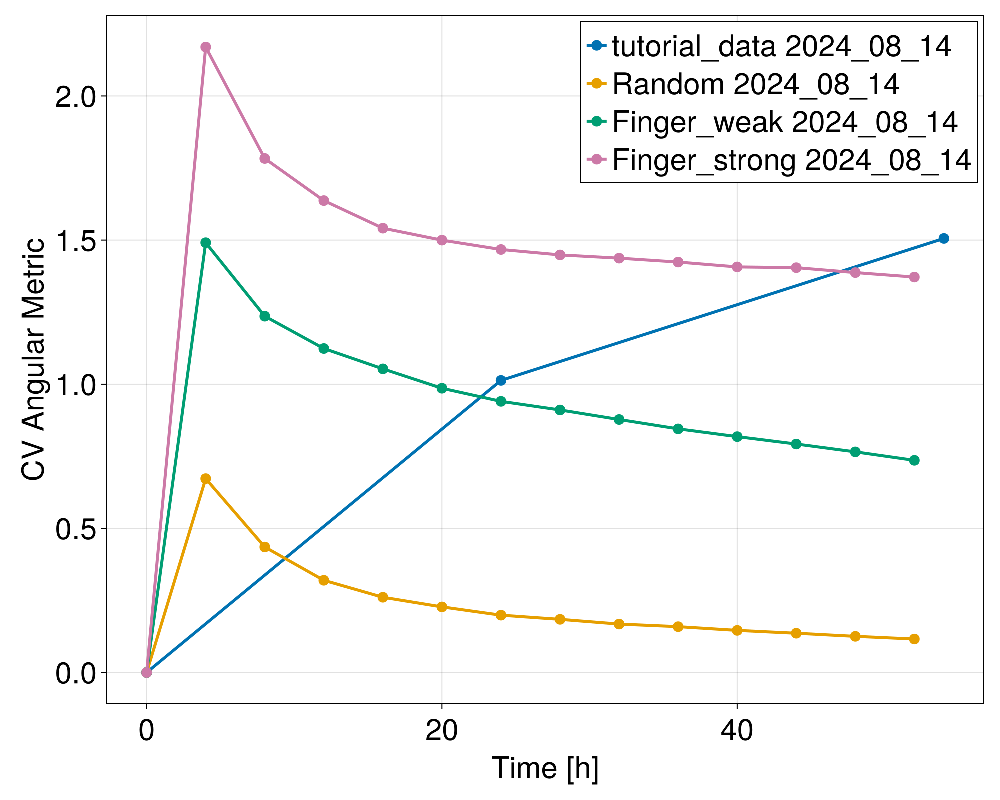

In [31]:
model_name = unique(df.data_set )    
j = 1
fig = Figure()
ax = Axis(fig[1,1], xlabel = "Time [h]", ylabel = "CV Angular Metric")
for (k, i) in pairs(groupby(cv_angular_metric,:data_set))
    scatterlines!(ax, i.time, i.cv_angu, label = "$(model_name[j])",linewidth = 3, markersize = 15)
    j += 1
end
axislegend(ax, position = :rt)
fig

#### 7.3 MaxP1 of the Pair correlation metric 

In [32]:
MaxP1 = @chain df begin
    groupby([:time,:data_set])
    @combine(:pair_og = mean((maximum.(:pair_OG).-mean.(:pair_OG))./mean.(:pair_OG)),
    :pair_og_stdd =std((maximum.(:pair_OG).-mean.(:pair_OG))./mean.(:pair_OG)),
     :pair_cov = mean((maximum.(:pair_cov).-mean.(:pair_cov))./mean.(:pair_cov)), :pair_cov_stdd =std((maximum.(:pair_cov).-mean.(:pair_cov))./mean.(:pair_cov)) )

end
first(MaxP1, 3) 

Row,time,data_set,pair_og,pair_og_stdd,pair_cov,pair_cov_stdd
,Int64,String,Float64,Float64,Float64,Float64
1,0,tutorial_data 2024_08_14,0.950975,0.916677,1.0468,1.21551
2,24,tutorial_data 2024_08_14,1.34772,1.94862,1.52344,0.249526
3,54,tutorial_data 2024_08_14,2.28613,0.727932,1.92817,0.363083


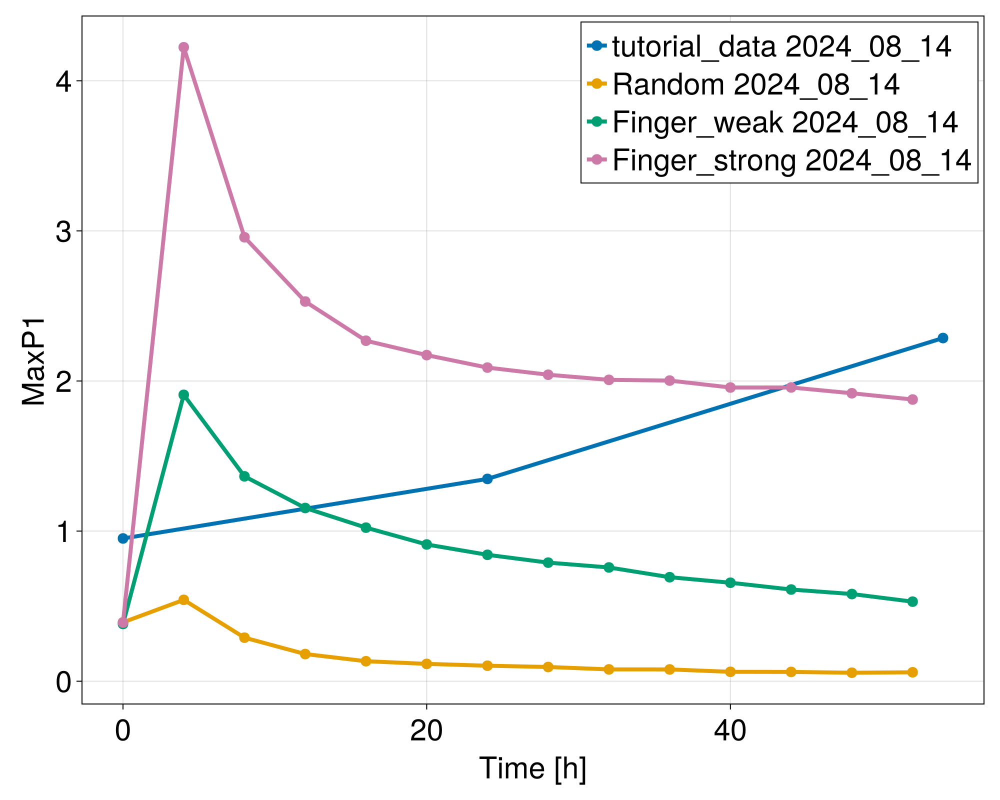

In [33]:
model_name = unique(MaxP1.data_set )    
j = 1
fig = Figure()
ax = Axis(fig[1,1], xlabel = "Time [h]", ylabel = "MaxP1")
for (k, i) in pairs(groupby(MaxP1,:data_set))
    scatterlines!(ax, i.time, i.pair_og, label = model_name[j],linewidth = 4, markersize = 15)
    j += 1
end
axislegend(ax, position = :rt)
fig